In [ ]:
globals().clear()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from numpy import random
import time
from scipy.stats import norm as norm
from IPython.core.display import display_pretty
from statistics import mean
from google.colab import files
import os

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
images_dir = '/content/gdrive/My Drive/DDMRP/Chase Strategy' 

Mounted at /content/gdrive


In [ ]:
scenario_name = '000'

try:
    os.mkdir('/content/gdrive/My Drive/DDMRP/Chase Strategy/CS_'+scenario_name)
except:
    pass 

## **Model**

In [ ]:
class DDMRP():
    def __init__(self, time, ini_realdemand, ini_demand, ini_leadtime, ini_moq, ini_title, ini_onhand, ini_desiredorder, ini_ltadj, ini_varadj, ini_bt):
        self.time = time 

        # Basic
        self.df1 = ini_demand 
        self.df2 = ini_realdemand
        self.ADU = 0
        self.ADUBackTrack = ini_bt
        self.LT = ini_leadtime 
        self.Lt_Adj = ini_ltadj 
        self.Var_Adj= ini_varadj 
        self.MOQ = ini_moq 
        self.batch = 1 #constant?
        self.title = ini_title
        self.desiredorder = ini_desiredorder 
        self.daily_demand = 0
        self.ADUnow = 0

        # Stock Level
        self.OrderReceived = 0
        self.AvailableStock = 0

        # Order
        self.SuggestedOrder = 0 #$$$$$
        self.LastOrderTime = 0 #$$$$$
        
        # Traffic
        self.RedBase = 0
        self.RedSafety = 0
        self.TOR = 0
        self.TOY = 0
        self.TOG = 0

        # Records
        if self.time == startcuckoo:
          self.hist_time = []
          self.hist_demand = []
          self.hist_onhand = []
          self.hist_send = [] 
          self.hist_order = []
          self.hist_TOR = []
          self.hist_TOG = []
          self.hist_TOY = []
          self.stockout = []
          self.NumOrder = []
          self.hist_fillrate = []
          self.sg = {} # order log
          self.gh = {} # actual receive log
          for v in np.arange(self.time - self.LT, self.time + 1): #ini order/acutal receive log
            self.sg[v] = 0
            self.gh[v] = 0  
          self.OrderOnHand = ini_onhand
          self.OpenSupply = 0 #pipeline inventory
        else:
          self.hist_time = dic[(ini_title, cuckoo - 1)].hist_time
          self.hist_demand = dic[(ini_title, cuckoo - 1)].hist_demand
          self.hist_onhand = dic[(ini_title, cuckoo - 1)].hist_onhand
          self.hist_send = dic[(ini_title, cuckoo - 1)].hist_send
          self.hist_order = dic[(ini_title, cuckoo - 1)].hist_order
          self.hist_TOR = dic[(ini_title, cuckoo - 1)].hist_TOR
          self.hist_TOG = dic[(ini_title, cuckoo - 1)].hist_TOG
          self.hist_TOY = dic[(ini_title, cuckoo - 1)].hist_TOY
          self.stockout = dic[(ini_title, cuckoo - 1)].stockout
          self.hist_fillrate = dic[(ini_title, cuckoo - 1)].hist_fillrate  
          self.sg = dic[(ini_title, cuckoo - 1)].sg
          self.gh = dic[(ini_title, cuckoo - 1)].gh
          self.OrderOnHand = dic[(ini_title, cuckoo - 1)].OrderOnHand
          self.OpenSupply = dic[(ini_title, cuckoo - 1)].OpenSupply
          self.NumOrder = dic[(ini_title, cuckoo - 1)].NumOrder
        
    def generate_demand(self):
        demandgen = self.df2.iloc[self.time : self.time + 1].mean(axis=0)
        return demandgen

    def CalculateADU(self):
        if self.time < self.ADUBackTrack:
          ADU = self.df1.iloc[0 : self.time + 1].mean(axis=0)
        else: 
          ADU = self.df1.iloc[self.time - self.ADUBackTrack: self.time].mean(axis=0) 
        return ADU

    def simulate(self):
        self.daily_demand = self.generate_demand()[0]
        self.ADUnow = self.CalculateADU()[0]

        # Demand
        passed = self.time - self.LT
        self.OrderReceived = self.gh[passed]
        self.OpenSupply -= self.sg[passed]
        self.hist_order.append(self.OrderReceived)
        
        self.OrderOnHand = max(self.OrderOnHand - self.daily_demand + self.OrderReceived, 0)
        if self.OrderOnHand < self.daily_demand:
          self.stockout.append(1)
          self.hist_fillrate.append(self.OrderOnHand/self.daily_demand)
        else:
          self.stockout.append(0)
          self.hist_fillrate.append(1)
        self.AvailableStock = self.OrderOnHand + self.OpenSupply - self.daily_demand 
        
        # Traffic
        self.RedBase = self.LT * self.ADUnow * self.Lt_Adj
        self.RedSafety = self.RedBase * self.Var_Adj
        self.TOR = self.RedBase + self.RedSafety
        self.TOY = self.TOR + self.LT * self.ADUnow
        self.TOG = self.TOY + max(self.MOQ, self.LT * self.ADUnow * self.Lt_Adj, self.desiredorder * self.ADUnow)
        
        # Order
        if self.AvailableStock <= self.TOY:
          self.NumOrder.append(1)
          self.SuggestedOrder = max(self.MOQ, self.TOG - self.AvailableStock)
          self.hist_send.append(self.SuggestedOrder)
          self.OpenSupply += self.SuggestedOrder
          self.sg[self.time] = self.SuggestedOrder
          self.gh[self.time] = self.SuggestedOrder
        else:
          self.NumOrder.append(0)
          self.hist_send.append(0)
          self.sg[self.time] = 0
          self.gh[self.time] = 0
        
        # Record
        self.hist_time.append(self.time)
        self.hist_onhand.append(self.OrderOnHand)
        self.hist_demand.append(self.daily_demand)
        self.hist_TOR.append(self.TOR)
        self.hist_TOY.append(self.TOY)
        self.hist_TOG.append(self.TOG)
        
    def plot_inventorylevel(self):
        dd = plt.figure(self.title)

        startpoint = 361
        plt.plot(self.hist_time[startpoint:], self.hist_demand[startpoint:], color = 'black', linewidth= 3)
        plt.plot(self.hist_time[startpoint:], self.hist_TOR[startpoint:], color = 'red')
        plt.plot(self.hist_time[startpoint:], self.hist_TOY[startpoint:], color = 'yellow')
        plt.plot(self.hist_time[startpoint:], self.hist_TOG[startpoint:], color = 'green')
        plt.plot(self.hist_time[startpoint:], self.hist_onhand[startpoint:], color = 'blue', linewidth= 3)
        plt.plot(self.hist_time[startpoint:], self.hist_order[startpoint:], color = 'brown', linewidth= 2)
        plt.plot(self.hist_time[startpoint:], self.hist_send[startpoint:], color = 'grey', linewidth= 2)

        plt.xticks(np.arange(startpoint,1080, 1))

        x = np.arange(startpoint,1080, 1)
        y1_red = np.array(self.hist_TOR[startpoint:])
        y1_yellow = np.array(self.hist_TOY[startpoint:])
        y1_green = np.array(self.hist_TOG[startpoint:])
        y2 = np.zeros(1080-startpoint)

        plt.fill_between(x, y1_green, y2, color='green')
        plt.fill_between(x, y1_yellow, y2, color='yellow')
        plt.fill_between(x, y1_red, y2, color='red')

        plt.grid(True)
        plt.xlabel('nth month')
        plt.title(self.title)
        dd.show()

        fig = plt.gcf()
        fig.set_size_inches(120, 30)
        images_dir = '/content/gdrive/My Drive/DDMRP/Chase Strategy/CS_' + scenario_name + '/'
        fig.savefig(f"{images_dir}"+self.title + ".png")

## **Nodes**

In [ ]:
A_demand = pd.DataFrame(pd.read_excel(r'/content/gdrive/My Drive/DDMRP/Chase Strategy/Demand/CS Demand.xlsx',header=4))

In [ ]:
# Demand
A1_demand = pd.DataFrame(A_demand.iloc[:,4])
A2_demand = pd.DataFrame(A_demand.iloc[:,5])
A3_demand = pd.DataFrame(A_demand.iloc[:,6])

A1_builddemand = pd.DataFrame(A_demand.iloc[:,4])
A2_builddemand = pd.DataFrame(A_demand.iloc[:,5])
A3_builddemand = pd.DataFrame(A_demand.iloc[:,6])

B1_builddemand = pd.DataFrame(A_demand.iloc[:,4])
B2_builddemand = pd.DataFrame(A_demand.iloc[:,5] + A_demand.iloc[:,6])

C1_builddemand = pd.DataFrame(A_demand.iloc[:,4] + A_demand.iloc[:,5] + A_demand.iloc[:,6])
C2_builddemand = pd.DataFrame(A_demand.iloc[:,4] + A_demand.iloc[:,5] + A_demand.iloc[:,6])
D1_builddemand = pd.DataFrame(A_demand.iloc[:,4] + A_demand.iloc[:,5] + A_demand.iloc[:,6])
D2_builddemand = pd.DataFrame(A_demand.iloc[:,4] + A_demand.iloc[:,5] + A_demand.iloc[:,6])
E1_builddemand = pd.DataFrame(A_demand.iloc[:,4] + A_demand.iloc[:,5] + A_demand.iloc[:,6])
F1_builddemand = pd.DataFrame(A_demand.iloc[:,4] + A_demand.iloc[:,5] + A_demand.iloc[:,6])

A1_davg = 21253
A2_davg = 842
A3_davg = 2531
All_davg = A1_davg + A2_davg + A3_davg

# Leadtime
A1_LT = 43
A2_LT = 3
A3_LT = 3
B1_LT = 8
B2_LT = 8
C1_LT = 7
C2_LT = 4
D1_LT = 56
D2_LT = 7
E1_LT = 78
F1_LT = 35

# Desired Order Frequency
A1_desiredorder = 6
A2_desiredorder = 73
A3_desiredorder = 20
B1_desiredorder = 24
B2_desiredorder = 37
C1_desiredorder = 5
C2_desiredorder = 1
D1_desiredorder = 15
D2_desiredorder = 33
E1_desiredorder = 46
F1_desiredorder = 122

# Leadtime Adjust
A1_LTAdj = 0.2
A2_LTAdj = 1
A3_LTAdj = 1
B1_LTAdj = 0.8
B2_LTAdj = 0.8
C1_LTAdj = 1
C2_LTAdj = 1
D1_LTAdj = 0.2
D2_LTAdj = 1
E1_LTAdj = 0.2
F1_LTAdj = 0.2

# Var Adjust
A1_varAdj = 0.2
A2_varAdj = 0.2
A3_varAdj = 0.2
B1_varAdj = 0.4
B2_varAdj = 0.4
C1_varAdj = 0.6
C2_varAdj = 0.6
D1_varAdj = 1
D2_varAdj = 1
E1_varAdj = 1
F1_varAdj = 1

# Order On Hand
A1_OrderOnHand = A1_davg * A1_LT * (1 + A1_LTAdj + A1_LTAdj * A1_varAdj)
A2_OrderOnHand = A2_davg * A2_LT * (1 + A2_LTAdj + A2_LTAdj * A2_varAdj)
A3_OrderOnHand = A3_davg * A3_LT * (1 + A3_LTAdj + A3_LTAdj * A3_varAdj)
B1_OrderOnHand = A1_davg * B1_LT * (1 + B1_LTAdj + B1_LTAdj * B1_varAdj)
B2_OrderOnHand = (A2_davg + A3_davg) * B2_LT * (1 + B2_LTAdj + B2_LTAdj * B2_varAdj)
C1_OrderOnHand = All_davg * C1_LT * (1 + C1_LTAdj + C1_LTAdj * C1_varAdj)
C2_OrderOnHand = All_davg * C2_LT * (1 + C2_LTAdj + C2_LTAdj * C2_varAdj)
D1_OrderOnHand = All_davg * D1_LT * (1 + D1_LTAdj + D1_LTAdj * D1_varAdj)
D2_OrderOnHand = All_davg * D2_LT * (1 + D2_LTAdj + D2_LTAdj * D2_varAdj)
E1_OrderOnHand = All_davg * E1_LT * (1 + E1_LTAdj + E1_LTAdj * E1_varAdj)
F1_OrderOnHand = All_davg * F1_LT * (1 + F1_LTAdj + F1_LTAdj * F1_varAdj)

# ADU Back Track
A1_ADUBackTrack = 60
A2_ADUBackTrack = 60
A3_ADUBackTrack = 60
B1_ADUBackTrack = 60
B2_ADUBackTrack = 60
C1_ADUBackTrack = 60
C2_ADUBackTrack = 60
D1_ADUBackTrack = 60
D2_ADUBackTrack = 60
E1_ADUBackTrack = 60
F1_ADUBackTrack = 60

# MOQ
A1_MOQ = 1
A2_MOQ = 1
A3_MOQ = 1
B1_MOQ = 1
B2_MOQ = 1
C1_MOQ = 1
C2_MOQ = 1
D1_MOQ = 1
D2_MOQ = 1
E1_MOQ = 1
F1_MOQ = 1

# Title
A1_title = 'A1'
A2_title = 'A2'
A3_title = 'A3'
B1_title = 'B1'
B2_title = 'B2'
C1_title = 'C1'
C2_title = 'C2'
D1_title = 'D1'
D2_title = 'D2'
E1_title = 'E1'
F1_title = 'F1'

## **Simulate**

In [ ]:
lis = ['A1','A2','A3','B1','B2','C1','C2','D1','D2','E1','F1']
lisA = ['A1','A2','A3']
lisB = ['B1','B2']
lisC = ['C1','C2']
lisD = ['D1','D2']
lisE = ['E1']
lisF = ['F1']
dic = {}

startcuckoo = 0
cuckoo = startcuckoo
zero = pd.DataFrame(np.zeros((10, 1)))

# simulate
while cuckoo <= len(A1_demand) - 1:
  # ------------------------------ A ------------------------------
  for i in lisA:
    dic[(i, cuckoo)] = DDMRP(cuckoo, globals()[i+"_demand"], globals()[i+"_builddemand"], globals()[i+"_LT"], globals()[i+"_MOQ"], globals()[i+"_title"], globals()[i+"_OrderOnHand"], globals()[i+"_desiredorder"], \
                             globals()[i+"_LTAdj"], globals()[i+"_varAdj"], globals()[i+"_ADUBackTrack"])
    dic[(i, cuckoo)].simulate()
  
  # agg demand
  sumAforB1 = [a1 for a1 in zip(dic[('A1',cuckoo)].hist_send)] #B1
  sumAforB2 = [a2 + a3 for a2, a3 in zip(dic[('A2',cuckoo)].hist_send, dic[('A3',cuckoo)].hist_send)] #B2
  B1_demand = zero.append(pd.DataFrame(sumAforB1))
  B2_demand = zero.append(pd.DataFrame(sumAforB2))
  # ------------------------------ B ------------------------------
  for i in lisB:
    dic[(i, cuckoo)] = DDMRP(cuckoo, globals()[i+"_demand"], globals()[i+"_builddemand"], globals()[i+"_LT"], globals()[i+"_MOQ"], globals()[i+"_title"], globals()[i+"_OrderOnHand"], globals()[i+"_desiredorder"], \
                             globals()[i+"_LTAdj"], globals()[i+"_varAdj"], globals()[i+"_ADUBackTrack"])
    dic[(i, cuckoo)].simulate()
  
  # adj back order
  if cuckoo > A1_ADUBackTrack:
    dic[('A1', cuckoo)].gh[cuckoo] = min(dic[('B1', cuckoo)].OrderOnHand/(dic[('B1', cuckoo)].daily_demand + 0.0000000001), 1) * dic[('A1', cuckoo)].gh[cuckoo]
    dic[('A2', cuckoo)].gh[cuckoo] = min(dic[('B2', cuckoo)].OrderOnHand/(dic[('B2', cuckoo)].daily_demand + 0.0000000001), 1) * dic[('A2', cuckoo)].gh[cuckoo]
    dic[('A3', cuckoo)].gh[cuckoo] = min(dic[('B2', cuckoo)].OrderOnHand/(dic[('B2', cuckoo)].daily_demand + 0.0000000001), 1) * dic[('A3', cuckoo)].gh[cuckoo]
  
  # agg demand  
  sumBforC1 = [(b1 + b2)/2 for b1, b2 in zip(dic[('B1',cuckoo)].hist_send, dic[('B2',cuckoo)].hist_send)] #C1
  sumBforC2 = [(b1 + b2)/2 for b1, b2 in zip(dic[('B1',cuckoo)].hist_send, dic[('B2',cuckoo)].hist_send)] #C2
  C1_demand = zero.append(pd.DataFrame(sumBforC1))
  C2_demand = zero.append(pd.DataFrame(sumBforC2))
  # ------------------------------ C ------------------------------
  for i in lisC:
    dic[(i, cuckoo)] = DDMRP(cuckoo, globals()[i+"_demand"], globals()[i+"_builddemand"], globals()[i+"_LT"], globals()[i+"_MOQ"], globals()[i+"_title"], globals()[i+"_OrderOnHand"], globals()[i+"_desiredorder"], \
                             globals()[i+"_LTAdj"], globals()[i+"_varAdj"], globals()[i+"_ADUBackTrack"])
    dic[(i, cuckoo)].simulate()

  # adj back order
  if cuckoo > A1_ADUBackTrack + B1_ADUBackTrack:
    dic[('B1', cuckoo)].gh[cuckoo] = min(dic[('C1', cuckoo)].OrderOnHand/(dic[('C1', cuckoo)].daily_demand + 0.0000000001), dic[('C2', cuckoo)].OrderOnHand/(dic[('C2', cuckoo)].daily_demand + 0.0000000001), 1) * dic[('B1', cuckoo)].gh[cuckoo]
    dic[('B2', cuckoo)].gh[cuckoo] = min(dic[('C1', cuckoo)].OrderOnHand/(dic[('C1', cuckoo)].daily_demand + 0.0000000001), dic[('C2', cuckoo)].OrderOnHand/(dic[('C2', cuckoo)].daily_demand + 0.0000000001), 1) * dic[('B2', cuckoo)].gh[cuckoo]

  # agg demand
  sumCforD1 = [c1 for c1 in zip(dic[('C1',cuckoo)].hist_send)] #D1
  sumCforD2 = [c2 for c2 in zip(dic[('C2',cuckoo)].hist_send)] #D2
  D1_demand = zero.append(pd.DataFrame(sumCforD1))
  D2_demand = zero.append(pd.DataFrame(sumCforD2))
  # ------------------------------ D ------------------------------
  for i in lisD:
    dic[(i, cuckoo)] = DDMRP(cuckoo, globals()[i+"_demand"], globals()[i+"_builddemand"], globals()[i+"_LT"], globals()[i+"_MOQ"], globals()[i+"_title"], globals()[i+"_OrderOnHand"], globals()[i+"_desiredorder"], \
                             globals()[i+"_LTAdj"], globals()[i+"_varAdj"], globals()[i+"_ADUBackTrack"])
    dic[(i, cuckoo)].simulate()

  # adj back order
  if cuckoo > A1_ADUBackTrack + B1_ADUBackTrack + C1_ADUBackTrack:
    dic[('C1', cuckoo)].gh[cuckoo] = min(dic[('D1', cuckoo)].OrderOnHand/(dic[('D1', cuckoo)].daily_demand + 0.0000000001), 1) * dic[('C1', cuckoo)].gh[cuckoo]
    dic[('C2', cuckoo)].gh[cuckoo] = min(dic[('D2', cuckoo)].OrderOnHand/(dic[('D2', cuckoo)].daily_demand + 0.0000000001), 1) * dic[('C2', cuckoo)].gh[cuckoo]

  # agg demand  
  sumDforE1 = [d2 for d2 in zip(dic[('D2',cuckoo)].hist_send)] #E1
  E1_demand = zero.append(pd.DataFrame(sumDforE1))  
  # ------------------------------ E ------------------------------
  for i in lisE:
    dic[(i, cuckoo)] = DDMRP(cuckoo, globals()[i+"_demand"], globals()[i+"_builddemand"], globals()[i+"_LT"], globals()[i+"_MOQ"], globals()[i+"_title"], globals()[i+"_OrderOnHand"], globals()[i+"_desiredorder"], \
                             globals()[i+"_LTAdj"], globals()[i+"_varAdj"], globals()[i+"_ADUBackTrack"])
    dic[(i, cuckoo)].simulate()

  # adj back order
  if cuckoo > A1_ADUBackTrack + B1_ADUBackTrack + C1_ADUBackTrack + D1_ADUBackTrack:
    dic[('D2', cuckoo)].gh[cuckoo] = min(dic[('E1', cuckoo)].OrderOnHand/(dic[('E1', cuckoo)].daily_demand + 0.0000000001), 1) * dic[('D2', cuckoo)].gh[cuckoo]
  
  # agg demand
  sumEforF1 = [e1 for e1 in zip(dic[('E1',cuckoo)].hist_send)] #F1
  F1_demand = zero.append(pd.DataFrame(sumEforF1))
  # ------------------------------ F ------------------------------
  for i in lisF:
    dic[(i, cuckoo)] = DDMRP(cuckoo, globals()[i+"_demand"], globals()[i+"_builddemand"], globals()[i+"_LT"], globals()[i+"_MOQ"], globals()[i+"_title"], globals()[i+"_OrderOnHand"], globals()[i+"_desiredorder"], \
                             globals()[i+"_LTAdj"], globals()[i+"_varAdj"], globals()[i+"_ADUBackTrack"])
    dic[(i, cuckoo)].simulate()

  # adj back order
  if cuckoo > A1_ADUBackTrack + B1_ADUBackTrack + C1_ADUBackTrack + D1_ADUBackTrack + E1_ADUBackTrack:
    dic[('E1', cuckoo)].gh[cuckoo] = min(dic[('F1', cuckoo)].OrderOnHand/(dic[('F1', cuckoo)].daily_demand + 0.0000000001), 1) * dic[('E1', cuckoo)].gh[cuckoo]


  cuckoo += 1

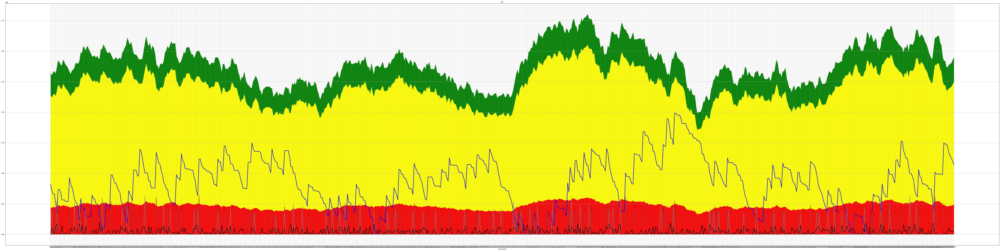

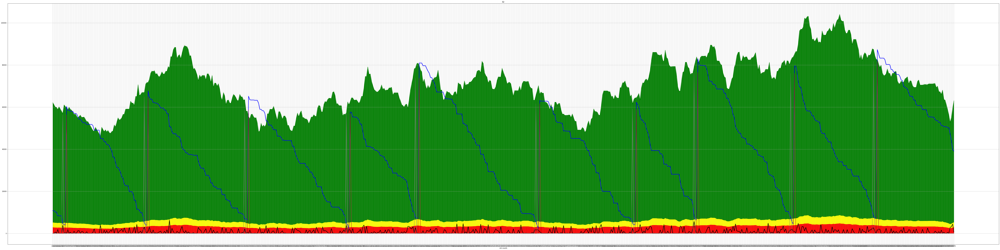

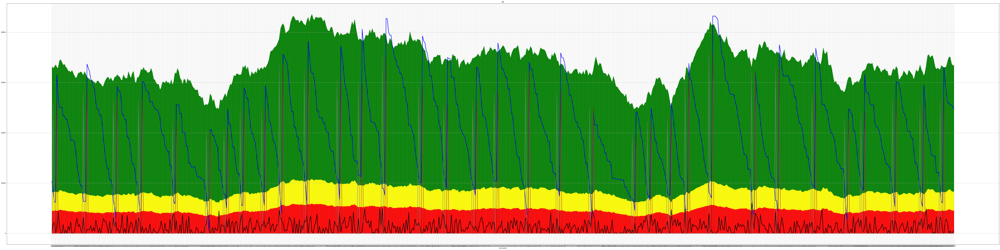

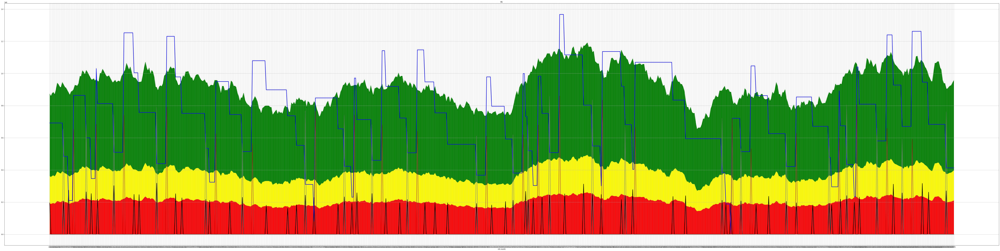

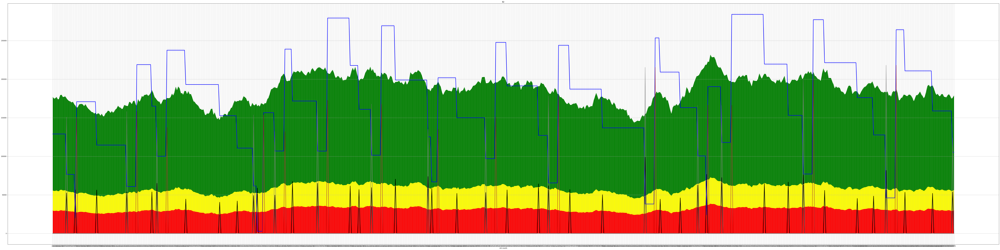

...

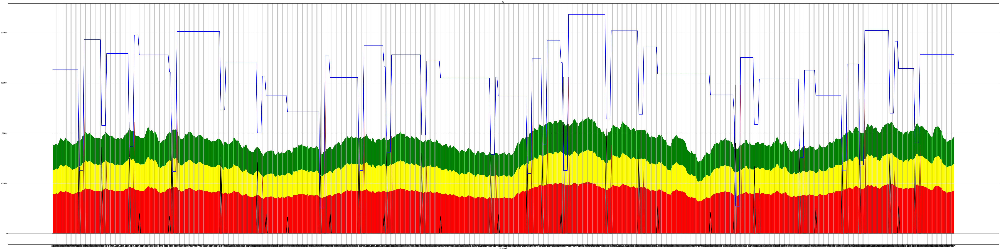

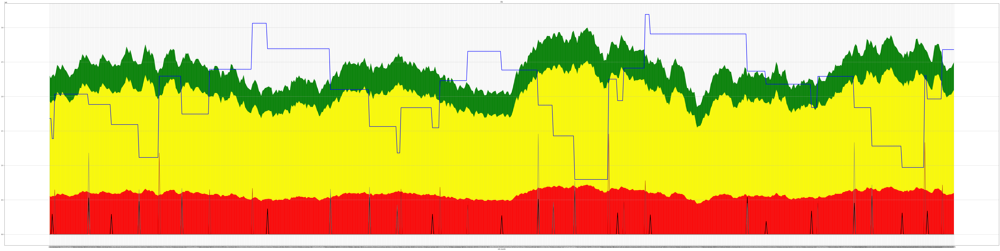

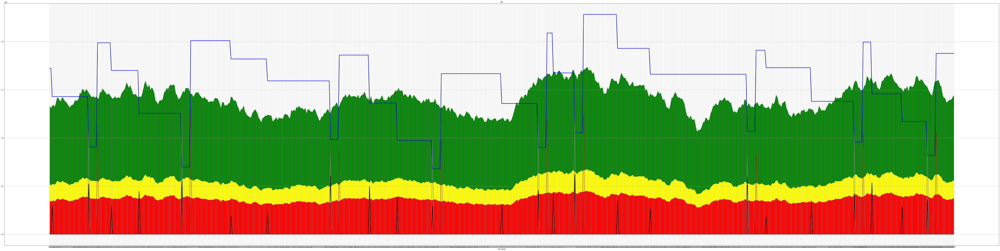

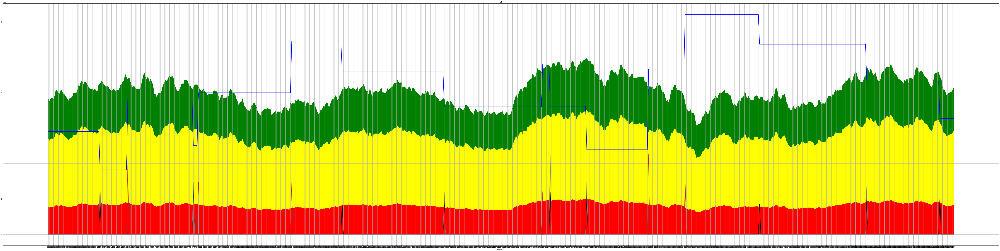

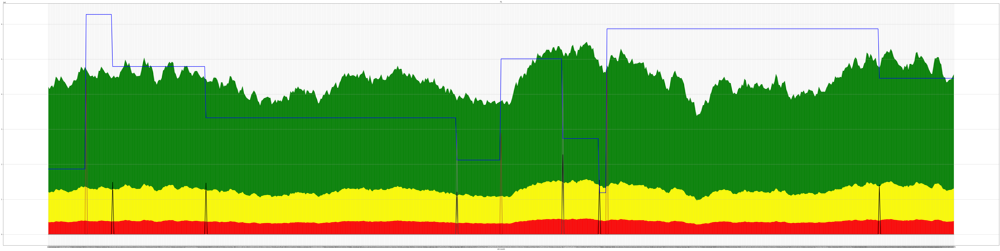

In [ ]:
# graph
for y in lis:
  dic[(y, cuckoo -1)].plot_inventorylevel()

In [ ]:
# Table
from tabulate import tabulate

start =361
mydata =[]
for i in lis:
  mydata.append([i, 
                 globals()[i+"_demand"][start:].mean()[0],
                 globals()[i+"_demand"][start:].std()[0]/(globals()[i+"_demand"][start:].mean()+0.000000001)[0],
                 globals()[i+"_OrderOnHand"], #--
                 globals()[i+"_LT"], #--
                 globals()[i+"_MOQ"], #--
                 globals()[i+"_desiredorder"], #--
                 globals()[i+"_LTAdj"], #--
                 globals()[i+"_varAdj"], #--
                 globals()[i+"_ADUBackTrack"], #--
                 mean(dic[(i, cuckoo-1)].hist_onhand[start:]),
                 sum(dic[(i, cuckoo-1)].NumOrder[start:]), 
                 sum(dic[(i, cuckoo-1)].stockout[start:]), 
                 mean(dic[(i, cuckoo-1)].hist_fillrate[start:])
                 ])
  
head = ["Node", "Avg Demand", "Norm Std Demand", "Initial Onhand", "Lead Time (Day)", "MOQ", "Desired Order Freq (Day)",  "Lead Time Adjust", "Var Adjust", \
         "ADU Back Track (Day)", "Avg Onhand", "Order Freq", "Num of Stockout", "Fill Rate"]
print(tabulate(mydata, headers=head, tablefmt="grid")) 

mydata = pd.DataFrame(mydata)
mydata.to_excel(r'/content/gdrive/My Drive/DDMRP/Chase Strategy/CS_' + scenario_name + '/Output.xlsx', index = False)

+--------+--------------+-------------------+------------------+-------------------+-------+----------------------------+--------------------+--------------+------------------------+------------------+--------------+-------------------+-------------+
| Node   |   Avg Demand |   Norm Std Demand |   Initial Onhand |   Lead Time (Day) |   MOQ |   Desired Order Freq (Day) |   Lead Time Adjust |   Var Adjust |   ADU Back Track (Day) |       Avg Onhand |   Order Freq |   Num of Stockout |   Fill Rate |
+========+==============+===================+==================+===================+=======+============================+====================+==============+========================+==================+==============+===================+=============+
| A1     |    22605.4   |          1.0367   |      1.13321e+06 |                43 |     1 |                          6 |                0.2 |          0.2 |                     60 | 421857           |           70 |                24 |    0.97467

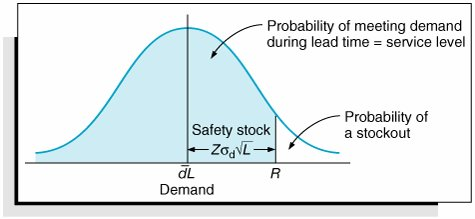

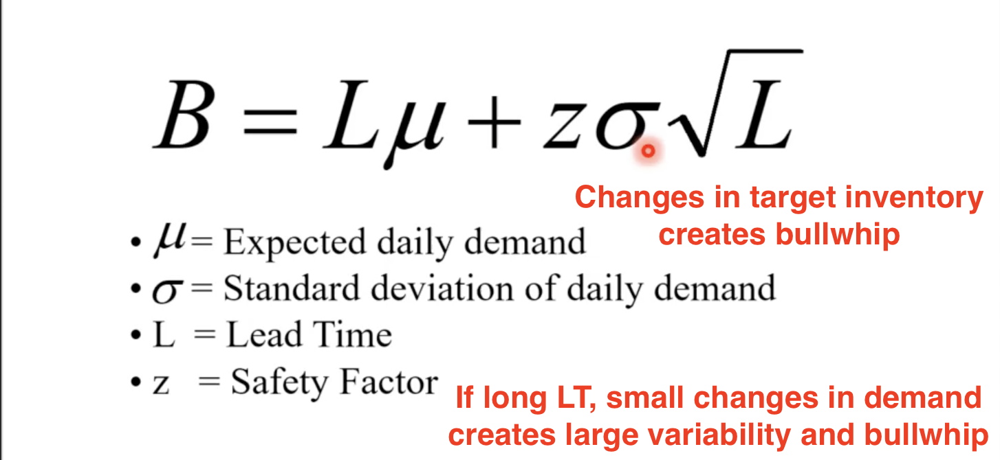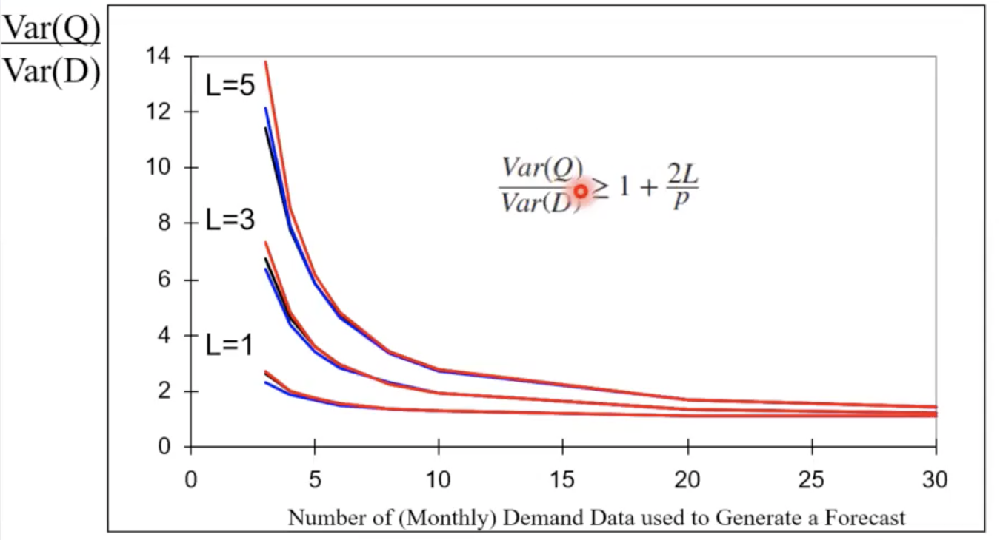

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive
